In [4]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
import parent

In [5]:
import data

In [7]:
d1_triangles, d2_triangles = data.get_dataset_triangles("train", hollow=True)
image_A, image_B = (x[0].cuda() for x in next(zip(d1_triangles, d2_triangles)))

In [8]:
from visualize import *

In [15]:
data_shape = [8, 1, 128, 128]
from torch import nn
from mermaidlite import *
class InverseConsistentLearningFree(nn.Module):
    def __init__(self, lmbda, noise=0):
        super(InverseConsistentLearningFree, self).__init__()
        self.sz = np.array(data_shape)
        self.spacing = 1./(self.sz[2::]-1) 
        
        self.noise = noise
        
        _id = identity_map_multiN(self.sz, self.spacing)
        self.identityMap = torch.from_numpy(_id).cuda()
        #The displacement map from image A to image B.
        self.register_parameter(name="D_AB",
            param=torch.nn.Parameter(torch.zeros([8, 2, 128, 128])))
        #and vice versa
        self.register_parameter(name="D_BA",
            param=torch.nn.Parameter(torch.zeros([8, 2, 128, 128])))
        self.lmbda = lmbda
        
        self.random_sampling=True
    def forward(self, image_A, image_B):
        self.D_AB_noise = self.D_AB + self.noise * torch.randn([8, 2, 128, 128]).cuda()
        self.D_BA_noise = self.D_BA + self.noise * torch.randn([8, 2, 128, 128]).cuda()
        self.phi_AB = self.D_AB_noise + self.identityMap
        self.phi_BA = self.D_BA_noise + self.identityMap
        
        self.warped_image_A = compute_warped_image_multiNC(
            image_A, self.phi_AB, self.spacing, 1)
        
        self.warped_image_B = compute_warped_image_multiNC(
            image_B, self.phi_BA, self.spacing, 1)
        
        

        
        Iepsilon = (
            self.identityMap 
            + torch.randn([8, 2, 128, 128]).cuda() * 1/128
        )        
        D_BA_epsilon = compute_warped_image_multiNC(self.D_BA_noise, Iepsilon, 
                                                    self.spacing, 1)
        
        D_AB_epsilon = compute_warped_image_multiNC(self.D_AB_noise, Iepsilon, 
                                                    self.spacing, 1)
        
        self.approximate_identity_ABBA = compute_warped_image_multiNC( 
                self.D_AB_noise, D_BA_epsilon + Iepsilon, self.spacing, 1
            ) + D_BA_epsilon
        
        self.approximage_identity_BAAB = compute_warped_image_multiNC(
                self.D_BA_noise, D_AB_epsilon + Iepsilon, self.spacing, 1
        ) + D_AB_epsilon 
        
        inverse_consistency_loss = self.lmbda * (
            torch.mean(self.approximate_identity_ABBA**2) 
            + torch.mean(self.approximage_identity_BAAB**2)
        )
        similarity_loss = (
            torch.mean((self.warped_image_A - image_B)**2) + 
            torch.mean((self.warped_image_B - image_A)**2)
        )
        
        transform_magnitude= self.lmbda * torch.mean(
            (self.identityMap - self.phi_AB)**2
        )
        self.all_loss =  inverse_consistency_loss + similarity_loss
        return [x.item() for x in 
                (inverse_consistency_loss, 
                 similarity_loss, 
                 transform_magnitude)
               ]
        

In [16]:
def train_no_learning(net, optimizer, image_A, image_B, epochs=400):
    
    
    loss_history = []
    print("[", end="")
    for epoch in range(epochs):
        print("-", end="")
        if (epoch + 1) % 5 == 0:
            print("]", end="\n[")

        for step in range(300):
            optimizer.zero_grad()
            inverse_consistency_loss, similarity_loss, transform_magnitude = net(
              image_A, image_B)


            loss = net.all_loss
            loss.backward()
            optimizer.step()
            du = (net.phi_AB[:, :, 1:, :-1] 
                - net.phi_AB[:, :, :-1, :-1]).detach().cpu()
            dv = (net.phi_AB[:, :, :-1, 1:] 
                - net.phi_AB[:, :, :-1, :-1]).detach().cpu()
            dA = du[:, 0] * dv[:, 1] - du[:, 1] * dv[:, 0]

            loss_history.append([inverse_consistency_loss, 
                              similarity_loss,
                              transform_magnitude, torch.log(torch.sum(dA < 0) + 0.1)])
    print("]")
    return loss_history

In [19]:
net_nolearning = InverseConsistentLearningFree(2048, noise=.01)
optimizer_nolearning = torch.optim.Adam(net_nolearning.parameters(), lr=.0001)
net_nolearning.train().cuda()
train_no_learning(net_nolearning, optimizer_nolearning, image_A[:8], image_B[:8])

[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[]


[[0.3681209087371826,
  0.18540669977664948,
  0.20462390780448914,
  tensor(10.8976)],
 [0.3676914572715759,
  0.18568313121795654,
  0.20432254672050476,
  tensor(10.8966)],
 [0.3681766986846924,
  0.18487083911895752,
  0.2048322856426239,
  tensor(10.8951)],
 [0.3692169487476349,
  0.18441160023212433,
  0.20531496405601501,
  tensor(10.8932)],
 [0.3700845241546631,
  0.18453967571258545,
  0.20545917749404907,
  tensor(10.8964)],
 [0.36946237087249756,
  0.18487189710140228,
  0.20555496215820312,
  tensor(10.8996)],
 [0.3686869144439697,
  0.1844574213027954,
  0.20517513155937195,
  tensor(10.8959)],
 [0.36724555492401123,
  0.1839282512664795,
  0.2048579454421997,
  tensor(10.9027)],
 [0.370051771402359,
  0.18405523896217346,
  0.20569172501564026,
  tensor(10.8948)],
 [0.3701089322566986, 0.1841285228729248, 0.2052600234746933, tensor(10.8990)],
 [0.36737239360809326,
  0.18394768238067627,
  0.2047194093465805,
  tensor(10.8970)],
 [0.36928239464759827,
  0.1837324202060699

In [28]:
net_nolearning.noise = .01
loss = train_no_learning(net_nolearning, optimizer_nolearning, image_A[:8], image_B[:8])

[-

KeyboardInterrupt: 

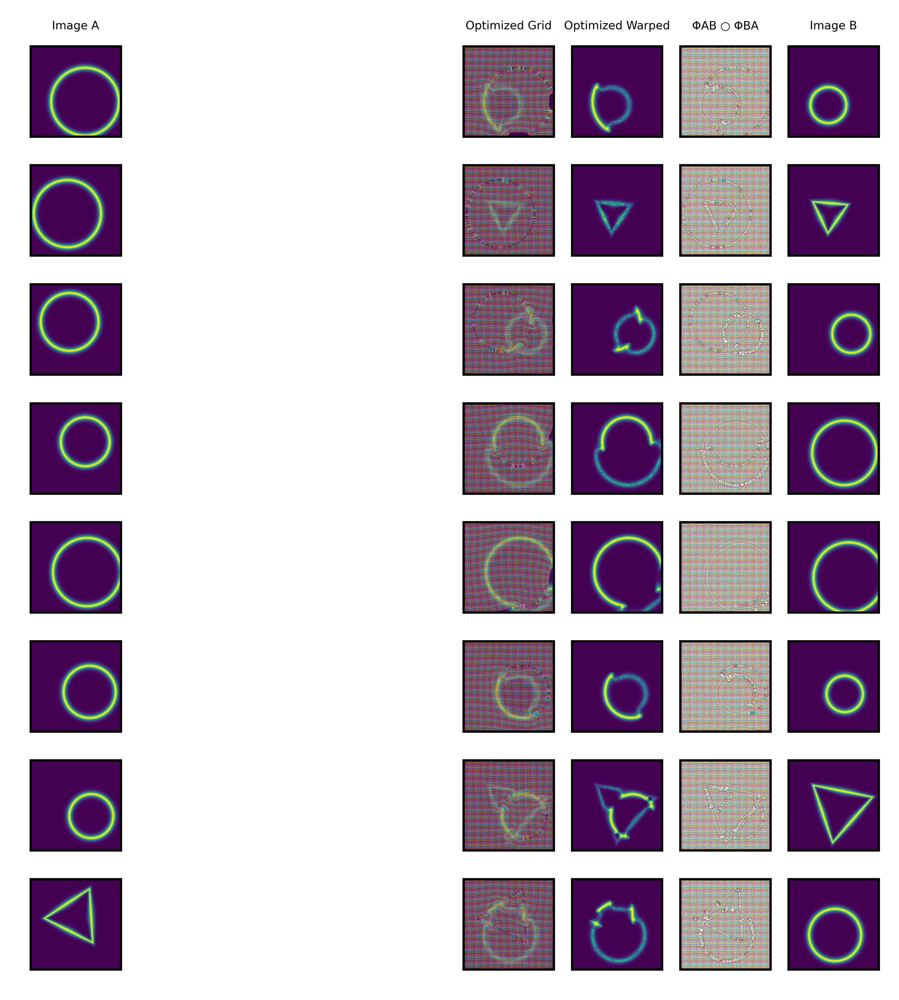

In [22]:
net_nolearning.noise = 0
net_nolearning(image_A[:8], image_B[:8])
wdth = 9
plt.figure(dpi=800, figsize=(6, 6))
plt.rcParams.update({'axes.titlesize': 4, 'text.usetex': False})

for row in range(8):
    
    plt.subplot(8, wdth, row * wdth +1)
    if not row:
        plt.title("Image A")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(image_A[row, 0].cpu())
    
    
    plt.subplot(8, wdth, row * wdth + 5)
    if not row:
        plt.title("Optimized Grid")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    #plt.title("Image B Warped")
    plt.imshow(net_nolearning.warped_image_B.detach().cpu()[row, 0])
    show_as_grid(net_nolearning.phi_AB[row])
    
    plt.subplot(8, wdth, row * wdth + 6)
    if not row:
        plt.title("Optimized Warped")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(net_nolearning.warped_image_B[row, 0].cpu().detach())
    
    plt.subplot(8, wdth, row * wdth + 7)
    if not row:
        plt.title("ΦAB ○ ΦBA")
    ax = plt.gca()
    ax.set_aspect("equal")
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    show_as_grid((compute_warped_image_multiNC(net_nolearning.D_BA, net_nolearning.phi_AB, net_nolearning.spacing, 1) + net_nolearning.phi_AB)[row])
    
    plt.subplot(8, wdth, row * wdth + 8)
    if not row:
        plt.title("Image B")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(image_B[row, 0].cpu())
    

plt.show()

In [ ]:
    visualizeRegistrationCompact?


In [ ]:
nolearning_history = _

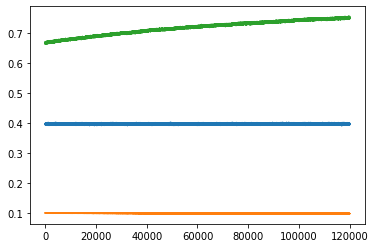

In [27]:
plt.plot(np.array(loss)[:, :3])

In [15]:
net_nolearning.D_BA.shape

torch.Size([8, 2, 128, 128])

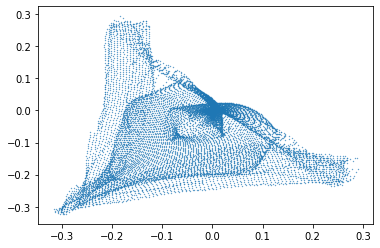

In [106]:
if not "N" in locals():
    N = -1
N += 1
N %= 8
x = torch.reshape(net_nolearning.D_BA[N,0, :, :], [128 * 128]).cpu().detach()
y = torch.reshape(net_nolearning.D_BA[N,1, :, :], [128 * 128]).cpu().detach()
plt.scatter(x, y, s=.1)

In [76]:
N

False

In [77]:
del N

In [110]:
net_nolearning_0 = InverseConsistentLearningFree(2048, noise=0)
optimizer_nolearning_0 = torch.optim.Adam(net_nolearning_0.parameters(), lr=.0001)
net_nolearning_0.train().cuda()
train_no_learning(net_nolearning_0, optimizer_nolearning_0, image_A[:8], image_B[:8])

[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[-----]
[--

KeyboardInterrupt: 

In [119]:
net_nolearning.noise = 0
net_nolearning(image_A[:8], image_B[:8])
net_nolearning_0(image_A[:8], image_B[:8])
wdth = 4
plt.figure(dpi=800, figsize=(3, 6))
plt.rcParams.update({'axes.titlesize': 4, 'text.usetex': False})

for row in range(8):
    
    plt.subplot(8, wdth, row * wdth +1)
    if not row:
        plt.title("Image A")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(image_A[row, 0].cpu())
    
    
    plt.subplot(8, wdth, row * wdth + 2)
    if not row:
        plt.title("Noise")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    #plt.title("Image B Warped")
    plt.imshow(net_nolearning.warped_image_B.detach().cpu()[row, 0])
    show_as_grid(net_nolearning.phi_AB[row])
    
    plt.subplot(8, wdth, row * wdth + 3)
    if not row:
        plt.title("no Noise")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    #plt.title("Image B Warped")
    plt.imshow(net_nolearning_0.warped_image_B.detach().cpu()[row, 0])
    show_as_grid(net_nolearning_0.phi_AB[row])
    
    
    
    plt.subplot(8, wdth, row * wdth + 4)
    if not row:
        plt.title("Image B")
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    plt.imshow(image_B[row, 0].cpu())
    

plt.show()